##### A part : Create a hash table data structure. Make this a class in python. It should have the array A, which should be a python list of sized m for some user-specied value of m, specified when the class is instantiated. Each position of this list should also store another python list as the chain of elements which are mapped to this bucket. You can choose the prime number to be p = 524287. Use random library in python to choose a as specified in class and then create the function such that it hashes element x to ha(x) = ((ax) mod p) mod m.

In [1]:
import random

In [2]:
class HashTable:
    def __init__(self, m, p = 524287):
        self.m = m
        self.p = p
        self.a = random.randint(1, p - 1) 
        self.A = [[] for _ in range(m)]
    
    def hash(self, key):
        return ((self.a * key) % self.p ) % self.m

    def insert(self, key):
        index = self.hash(key)
        self.A[index].append(key)

    def __str__(self):
        return str(self.A)


In [3]:
num = 100
m = 10
H = HashTable(m)
H.insert(num)

In [4]:
print(H)

[[], [], [], [], [], [], [100], [], [], []]


##### B part : We will experiment with a hash function that maps strings to buckets. Consider the data file word.txt. We will use the md5 hash function to create a hashtable from this. You can read how to use the md5 library in here. Use the hexdigest() method and then take the last 4 digits. This will create a hash function that maps any string into an index between 0 and 164 = 65536. For each string in the input file, output the hash value.

##### Reference : https://www.geeksforgeeks.org/md5-hash-python/

In [5]:
import hashlib

In [6]:
def hash_string(s):
    return int(hashlib.md5(s.encode()).hexdigest()[-4:], 16)

In [7]:
hash_values = {}

In [8]:
f = open("words.txt", "r")
words = f.readlines()
for word in words:
    hash_val = hash_string(word.strip('\n'))
    print("Hash Value of", word.strip(), "is", hash_val)
    hash_values[word.strip()] = hash_val
f.close()

Hash Value of &c is 24484
Hash Value of 'd is 349
Hash Value of 'em is 14811
Hash Value of 'll is 30807
Hash Value of 'm is 5815
Hash Value of 'mid is 64890
Hash Value of 'midst is 32364
Hash Value of 'mongst is 26453
Hash Value of 'prentice is 60118
Hash Value of 're is 3853
Hash Value of 's is 31625
Hash Value of 'sblood is 58923
Hash Value of 'sbodikins is 49247
Hash Value of 'sdeath is 4948
Hash Value of 'sfoot is 3340
Hash Value of 'sheart is 38594
Hash Value of 'shun is 19568
Hash Value of 'slid is 33738
Hash Value of 'slife is 9304
Hash Value of 'slight is 16935
Hash Value of 'snails is 46847
Hash Value of 'strewth is 25856
Hash Value of 't is 61634
Hash Value of 'til is 8761
Hash Value of 'tis is 36645
Hash Value of 'twas is 60712
Hash Value of 'tween is 53697
Hash Value of 'twere is 44188
Hash Value of 'twill is 14347
Hash Value of 'twixt is 5711
Hash Value of 'twould is 2011
Hash Value of 'un is 42027
Hash Value of 've is 27299
Hash Value of 1080 is 14144
Hash Value of 10th i

In [9]:
hash_values

{'&c': 24484,
 "'d": 349,
 "'em": 14811,
 "'ll": 30807,
 "'m": 5815,
 "'mid": 64890,
 "'midst": 32364,
 "'mongst": 26453,
 "'prentice": 60118,
 "'re": 3853,
 "'s": 31625,
 "'sblood": 58923,
 "'sbodikins": 49247,
 "'sdeath": 4948,
 "'sfoot": 3340,
 "'sheart": 38594,
 "'shun": 19568,
 "'slid": 33738,
 "'slife": 9304,
 "'slight": 16935,
 "'snails": 46847,
 "'strewth": 25856,
 "'t": 61634,
 "'til": 8761,
 "'tis": 36645,
 "'twas": 60712,
 "'tween": 53697,
 "'twere": 44188,
 "'twill": 14347,
 "'twixt": 5711,
 "'twould": 2011,
 "'un": 42027,
 "'ve": 27299,
 '1080': 14144,
 '10th': 15504,
 '1st': 52200,
 '2': 34348,
 '2nd': 10028,
 '3rd': 41713,
 '4th': 42428,
 '5th': 56798,
 '6th': 37418,
 '7th': 36789,
 '8th': 17636,
 '9th': 5063,
 'a': 9825,
 "a'": 28004,
 "a's": 16671,
 'a/c': 57493,
 'a1': 22434,
 'aa': 18706,
 'aaa': 63496,
 'aah': 3233,
 'aahed': 19796,
 'aahing': 23623,
 'aahs': 47170,
 'aal': 12812,
 'aalii': 10149,
 'aaliis': 38018,
 'aals': 34647,
 'aam': 32473,
 'aardvark': 25173,


##### C part : We will experiment with the maximum chain length for two hash functions. The first one is the universal hash function you created in problem (a). The second one is a random hash function, which you can create as the following line of Python code for a given value x. We will store the targets of this random hash function in a python dictionary as h[x] = int(m * random.random()), where h[x] is the bucket index of the table where x should be stored. Choose m = 500000. Now, for each of the two hash functions, calculate the hash bucket index for all numbers in 1, . . . , m, and find out the maximum and minimum number of elements in a bucket. Do this experiment 5 times for each of the hash functions. Present your result in a table or bar graph. Which of these hash functions has more of a difference between the maximum and minimum chain?

In [10]:
m = 500000

def random_hash(m):
    return int(random.random() * m)

In [11]:
def max_min_chain(hash_table, m):
    max_chain = 0
    min_chain = m
    for bucket in hash_table:
        if len(bucket) > max_chain:
            max_chain = len(bucket)
        if len(bucket) < min_chain:
            min_chain = len(bucket)
    return max_chain, min_chain

In [12]:
def get_hashtable_random(m):
    hash_table = [[] for _ in range(m)]
    for key in range(1, m + 1):
        index = random_hash(m)
        hash_table[index].append(key)
    return hash_table

In [13]:
def get_hashtable_universal(m):
    hash_table = HashTable(m)
    for key in range(1, m + 1):
        hash_table.insert(key)
    return hash_table.A

In [14]:
universal_max_chain = []
universal_min_chain = []
random_max_chain = []
random_min_chain = []

In [15]:
for _ in range(5):
    universal_hash_table = get_hashtable_universal(m)
    max_chain_universal, min_chain_universal = max_min_chain(universal_hash_table, m)
    random_hash_table = get_hashtable_random(m)
    max_chain_random, min_chain_random = max_min_chain(random_hash_table, m)
    universal_max_chain.append(max_chain_universal)
    universal_min_chain.append(min_chain_universal)
    random_max_chain.append(max_chain_random)
    random_min_chain.append(min_chain_random)

In [16]:
import matplotlib.pyplot as plt

labels = ['Run 1', 'Run 2', 'Run 3', 'Run 4', 'Run 5']
x = range(len(labels))

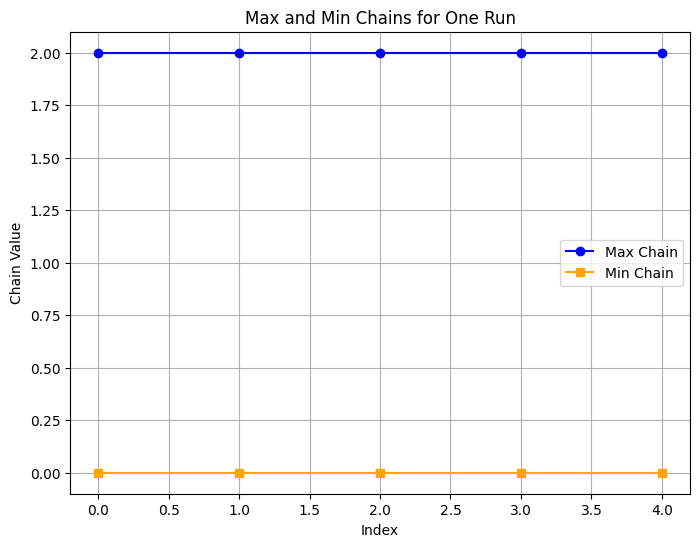

In [17]:
plt.figure(figsize=(8, 6))
plt.plot(x, universal_max_chain, label="Max Chain", marker='o', color='blue')
plt.plot(x, universal_min_chain, label="Min Chain", marker='s', color='orange')

# Add titles and labels
plt.title("Max and Min Chains for One Run")
plt.xlabel("Index")
plt.ylabel("Chain Value")
plt.legend()  # Add legend to distinguish lines
plt.grid(True)  # Add grid for better visualization

# Show the plot
plt.show()

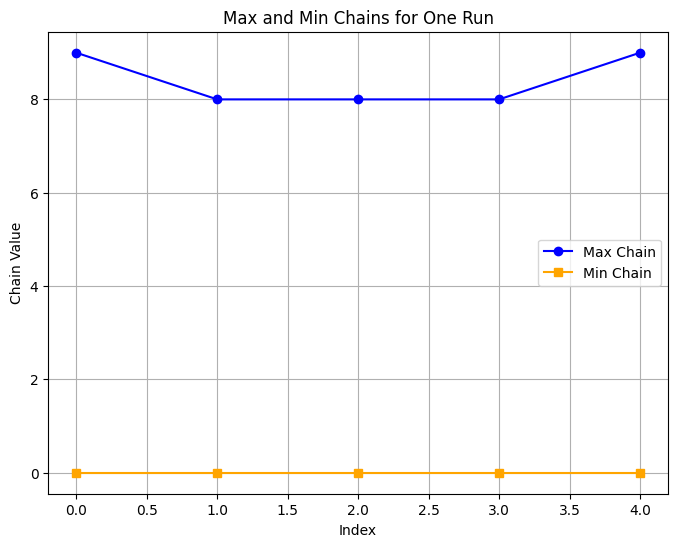

In [18]:
plt.figure(figsize=(8, 6))
plt.plot(x, random_max_chain, label="Max Chain", marker='o', color='blue')
plt.plot(x, random_min_chain, label="Min Chain", marker='s', color='orange')

# Add titles and labels
plt.title("Max and Min Chains for One Run")
plt.xlabel("Index")
plt.ylabel("Chain Value")
plt.legend()  # Add legend to distinguish lines
plt.grid(True)  # Add grid for better visualization

# Show the plot
plt.show()

In [19]:
u_diffs = [universal_max_chain[i] - universal_min_chain[i] for i in range(5)]
r_diffs = [random_max_chain[i] - random_min_chain[i] for i in range(5)]

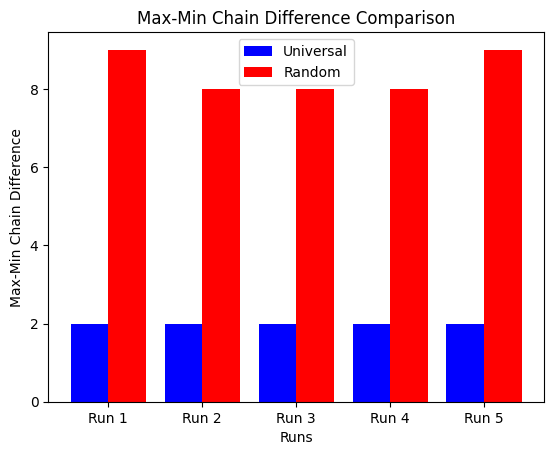

In [20]:
plt.bar(x, u_diffs, width=0.4, label='Universal', color='blue', align='center')
plt.bar([i + 0.4 for i in x], r_diffs, width=0.4, label='Random', color='red', align='center')
plt.xticks([i + 0.2 for i in x], labels)
plt.xlabel('Runs')
plt.ylabel('Max-Min Chain Difference')
plt.title('Max-Min Chain Difference Comparison')
plt.legend()
plt.show()

##### D part : Use Flajolet-Martin to estimate the number of unique words in the list. Consider the id of every word as the last 4 digits as used in problem (b) and use the universal hashing of problem (a) with m = 500000 to compute the hash values of every id. Compute the trailing zeroes of every hash function and maintain the largest trailing zeros as z until the end of the ids. Finally, return 2<sup>z+1/2</sup>.

https://www.geeksforgeeks.org/flajolet-martin-algorithm/

In [31]:
words = [word.strip() for word in words]

In [32]:
hash_table = HashTable(m = 500000)

In [33]:
def get_trailing_zeroes(z):
    if z == 0:
        return 1
    count = 0
    while z & 1 == 0:
        count += 1
        z >>= 1
    return count

In [34]:
def flajolet_martin():
    max_trailing_zeroes = float('-inf')
    for word in words:
        id = hash_values[word]
        hash_val = hash_table.hash(id)
        z = get_trailing_zeroes(hash_val)
        max_trailing_zeroes = max(max_trailing_zeroes, z)
    return 2 ** (max_trailing_zeroes + 0.5)

In [35]:
print(flajolet_martin())

370727.60009473265


In [26]:
len(set(words))

354984